In [1]:
# ---------------------------------- Importación de Librerías ----------------------------------

# Librerías básicas
import os
from collections import Counter

# Manipulación de datos
import numpy as np
import pandas as pd

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns

# Procesamiento de imágenes
from PIL import Image
import cv2

# Deep Learning
import torch
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from torch import nn

# Reducción de dimensionalidad
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Configuración de estilo para gráficos
sns.set_style('whitegrid')


In [2]:

# ---------------------------------- Configuración del Dispositivo ----------------------------------

# Verificar si CUDA está disponible y configurar el dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")


Usando dispositivo: cuda


In [3]:
# ---------------------------------- Definición de Transformaciones ----------------------------------

# Definir las transformaciones a aplicar a las imágenes
transform = transforms.Compose([
    transforms.Resize((224, 224)),      # Redimensionar imágenes a 224x224 píxeles (tamaño estándar para modelos preentrenados)
    transforms.ToTensor(),              # Convertir imágenes a tensores
    transforms.Normalize(               # Normalizar con los valores medios y desviaciones estándar de ImageNet
        mean=[0.485, 0.456, 0.406],
        std= [0.229, 0.224, 0.225]
    )
])


In [4]:
# ---------------------------------- Carga del Dataset ----------------------------------

# # Montar Google Drive si estás utilizando Colab
# from google.colab import drive
# drive.mount('/content/drive')

# Directorio de imágenes original
images_dir = '../last_data'

# Verificar si el directorio existe
if not os.path.exists(images_dir):
    raise FileNotFoundError(f"La ruta especificada '{images_dir}' no existe.")

# Cargar el dataset usando ImageFolder
dataset = datasets.ImageFolder(root=images_dir, transform=transform)

# Obtener los nombres de las clases a partir del dataset
class_names = dataset.classes
num_classes = len(class_names)
print(f"Clases encontradas: {class_names}")

# Crear un DataLoader para manejar el batching y el shuffle
batch_size = 32
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)


Clases encontradas: ['Chinche salivosa', 'Clororis', 'Hoja sana', 'Roya naranja', 'Roya purpura']


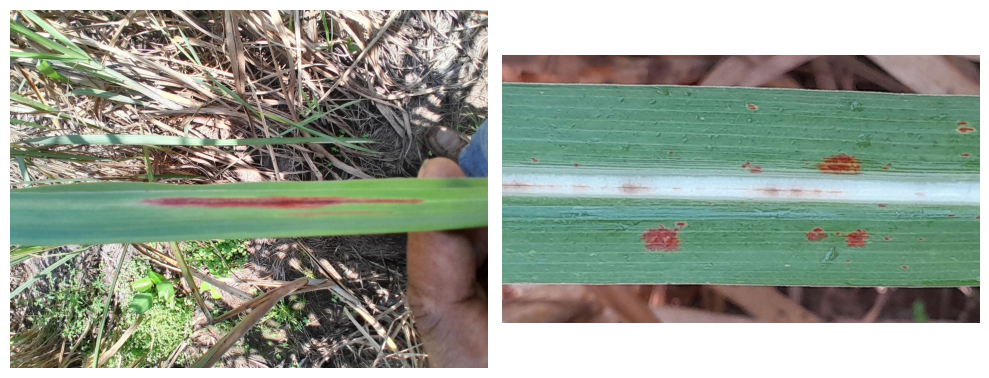

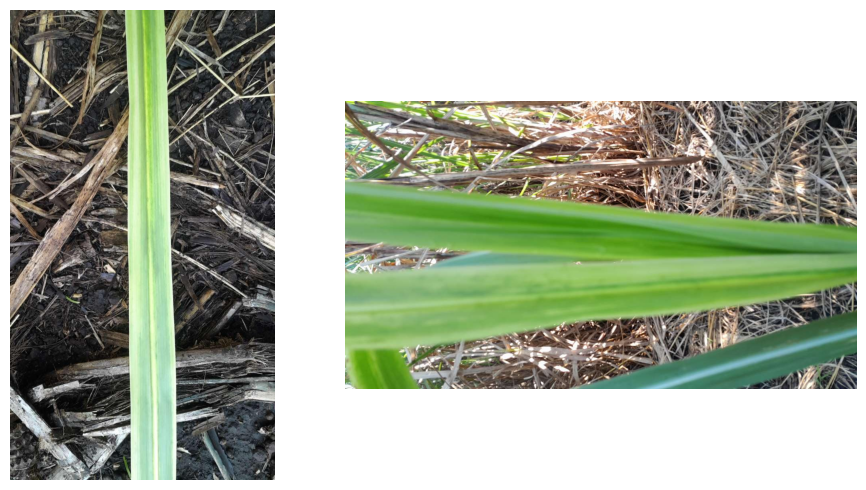

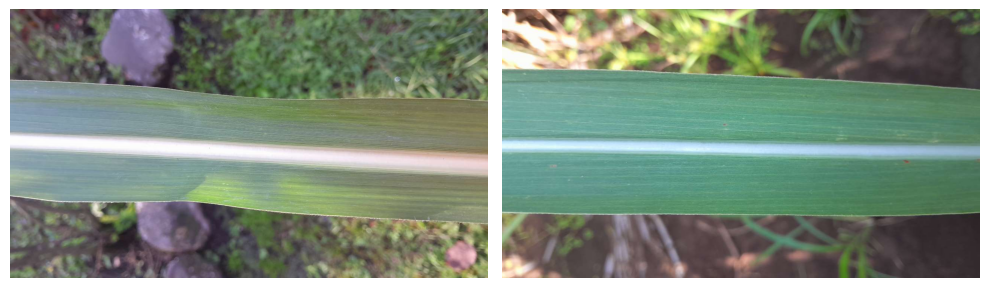

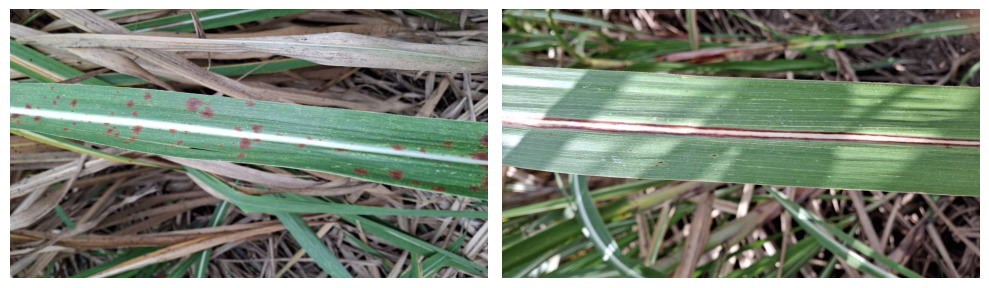

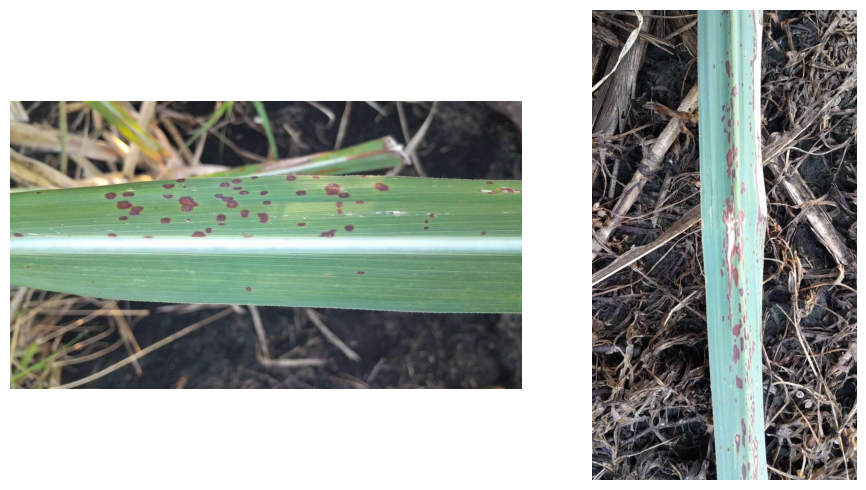

In [5]:
# --------------------- 1. Visualización de Muestras de Imágenes ---------------------

def show_sample_images_per_class(dataset, class_names, num_images=2):
    """
    Muestra muestras de imágenes de cada clase en celdas separadas con un tamaño de imagen más grande.

    Args:
        dataset (Dataset): El dataset de imágenes.
        class_names (list): Lista con los nombres de las clases.
        num_images (int): Número de imágenes a mostrar por clase.
    """
    # Crear un diccionario para almacenar imágenes por clase
    images_per_class = {class_name: [] for class_name in class_names}

    # Recopilar rutas de imágenes para cada clase
    for img_path, label in dataset.samples:
        class_name = class_names[label]
        if len(images_per_class[class_name]) < num_images:
            images_per_class[class_name].append(img_path)

    # Iterar sobre cada clase y mostrar sus imágenes en una celda diferente
    for class_name in class_names:
        # Configurar la figura para la clase actual con celdas más grandes
        fig, axes = plt.subplots(1, num_images, figsize=(num_images*5, 5))  # Aumentar el tamaño de la figura

        # Mostrar las imágenes para la clase actual
        for jdx, img_path in enumerate(images_per_class[class_name]):
            image = Image.open(img_path).convert('RGB')
            axes[jdx].imshow(image)
            axes[jdx].axis('off')
        
        plt.tight_layout()
        plt.show()

# Llamar a la función para mostrar imágenes de muestra por clase
show_sample_images_per_class(dataset, class_names)


C:\Users\ealda\AppData\Local\Temp\ipykernel_6708\1674707736.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Clase', y='Número de Imágenes', data=df_counts, palette='viridis')


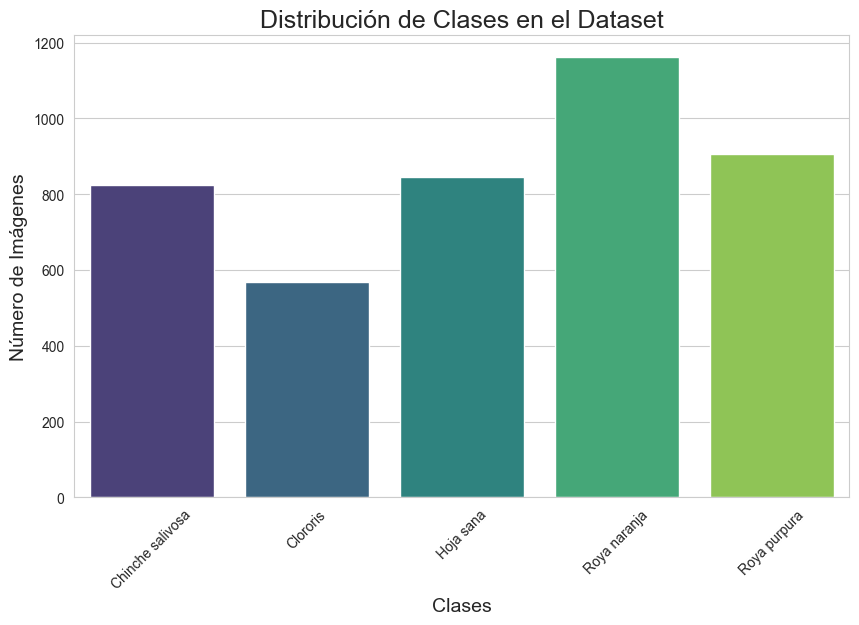

In [6]:
# --------------------- 2. Distribución de Clases ---------------------

def plot_class_distribution(dataset, class_names):
    """
    Muestra la distribución de clases en el dataset.

    Args:
        dataset (Dataset): El dataset de imágenes.
        class_names (list): Lista con los nombres de las clases.
    """
    # Extraer etiquetas
    labels = [label for _, label in dataset.samples]

    # Contar el número de imágenes por clase
    class_counts = Counter(labels)
    counts = [class_counts[i] for i in range(len(class_names))]

    # Crear un DataFrame para facilitar la visualización
    df_counts = pd.DataFrame({'Clase': class_names, 'Número de Imágenes': counts})

    # Gráfico de barras
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Clase', y='Número de Imágenes', data=df_counts, palette='viridis')
    plt.title('Distribución de Clases en el Dataset', fontsize=18)
    plt.xlabel('Clases', fontsize=14)
    plt.ylabel('Número de Imágenes', fontsize=14)
    plt.xticks(rotation=45)
    plt.show()

# Llamar a la función para plotear la distribución de clases
plot_class_distribution(dataset, class_names)

In [7]:
# --------------------- 3. Análisis de Propiedades de las Imágenes ---------------------

def analyze_image_properties(dataset):
    """
    Analiza propiedades como tamaño, aspecto, brillo y contraste de las imágenes.

    Args:
        dataset (Dataset): El dataset de imágenes.
    """
    # Listas para almacenar las propiedades
    widths = []
    heights = []
    aspects = []
    brightness = []
    contrast = []

    # Iterar sobre las imágenes
    for img_path, _ in dataset.samples:
        image = Image.open(img_path).convert('L')  # Convertir a escala de grises
        width, height = image.size
        widths.append(width)
        heights.append(height)
        aspects.append(width / height)
        img_array = np.array(image)
        brightness.append(np.mean(img_array))
        contrast.append(np.std(img_array))

    # Crear DataFrame para análisis
    df = pd.DataFrame({
        'Ancho': widths,
        'Alto': heights,
        'Aspecto': aspects,
        'Brillo': brightness,
        'Contraste': contrast
    })

    return df

# Llamar a la función para analizar propiedades de las imágenes
df = analyze_image_properties(dataset)


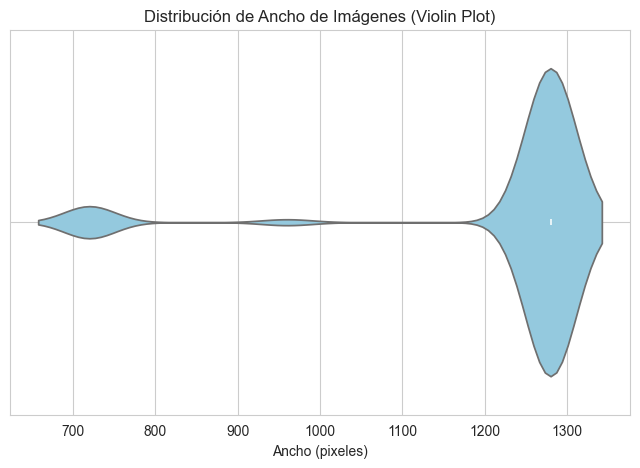

In [36]:
# Histograma de 'Ancho'
# 2. Violin Plot
plt.figure(figsize=(8, 5))
sns.violinplot(x=df['Ancho'], color='skyblue')
plt.title('Distribución de Ancho de Imágenes (Violin Plot)')
plt.xlabel('Ancho (pixeles)')
plt.grid(True)
plt.show()
plt.show()


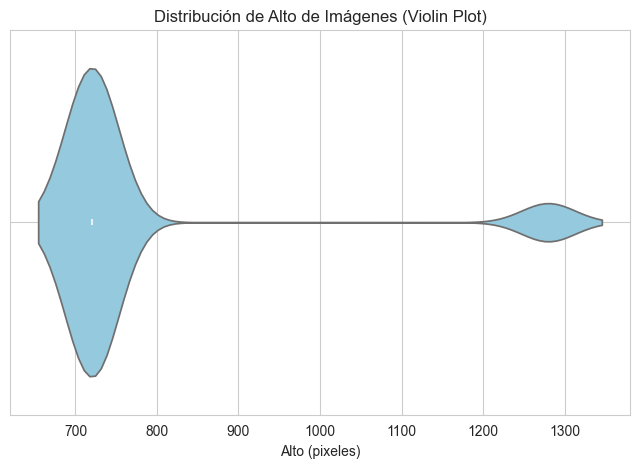

In [37]:
# Histograma de 'Alto'
# 2. Violin Plot para 'Alto'
plt.figure(figsize=(8, 5))
sns.violinplot(x=df['Alto'], color='skyblue')
plt.title('Distribución de Alto de Imágenes (Violin Plot)')
plt.xlabel('Alto (pixeles)')
plt.grid(True)
plt.show()


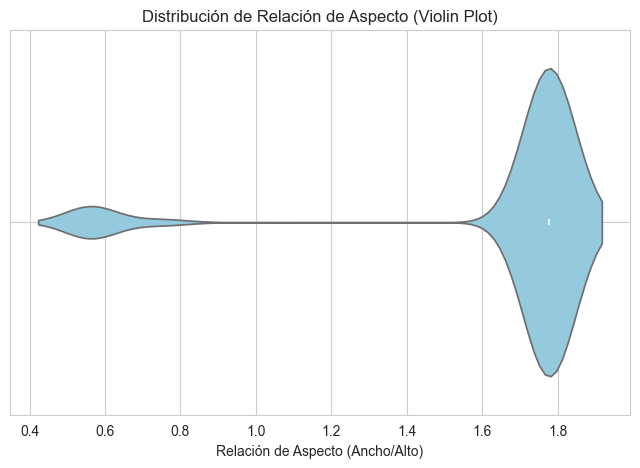

In [38]:

# Histograma de 'Aspecto'
plt.figure(figsize=(8, 5))
sns.violinplot(x=df['Aspecto'], color='skyblue')
plt.title('Distribución de Relación de Aspecto (Violin Plot)')
plt.xlabel('Relación de Aspecto (Ancho/Alto)')
plt.grid(True)
plt.show()


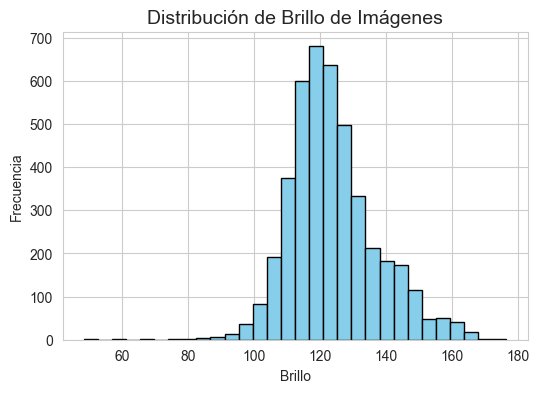

In [11]:
# Histograma de 'Brillo'
df['Brillo'].hist(figsize=(6, 4), bins=30, color='skyblue', edgecolor='black')
plt.title('Distribución de Brillo de Imágenes', fontsize=14)
plt.xlabel('Brillo')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


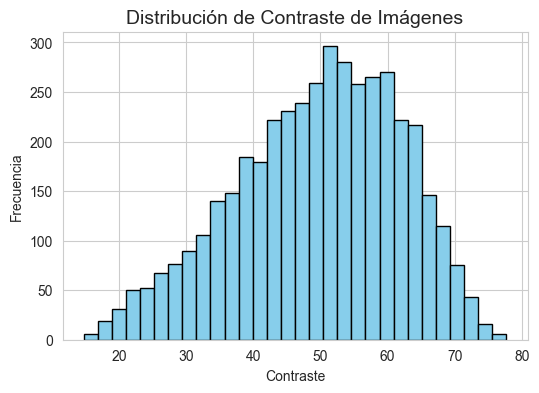

In [12]:
# Histograma de 'Contraste'
df['Contraste'].hist(figsize=(6, 4), bins=30, color='skyblue', edgecolor='black')
plt.title('Distribución de Contraste de Imágenes', fontsize=14)
plt.xlabel('Contraste')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


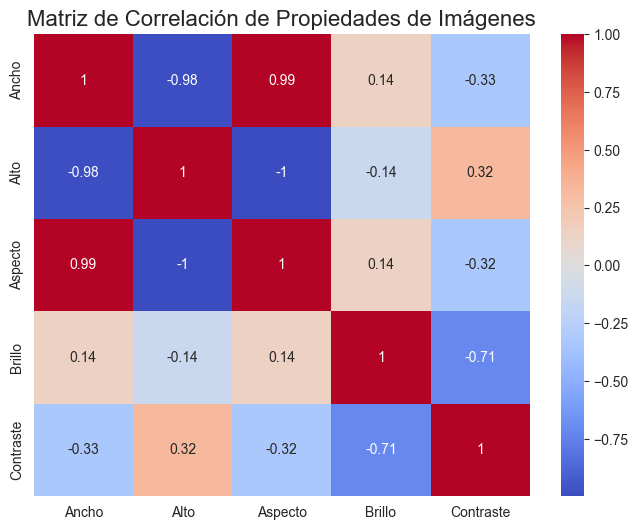

In [13]:
# Matriz de correlación
plt.figure(figsize=(8, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Matriz de Correlación de Propiedades de Imágenes', fontsize=16)
plt.show()



Aplicando filtros a una imagen de la clase: Chinche salivosa


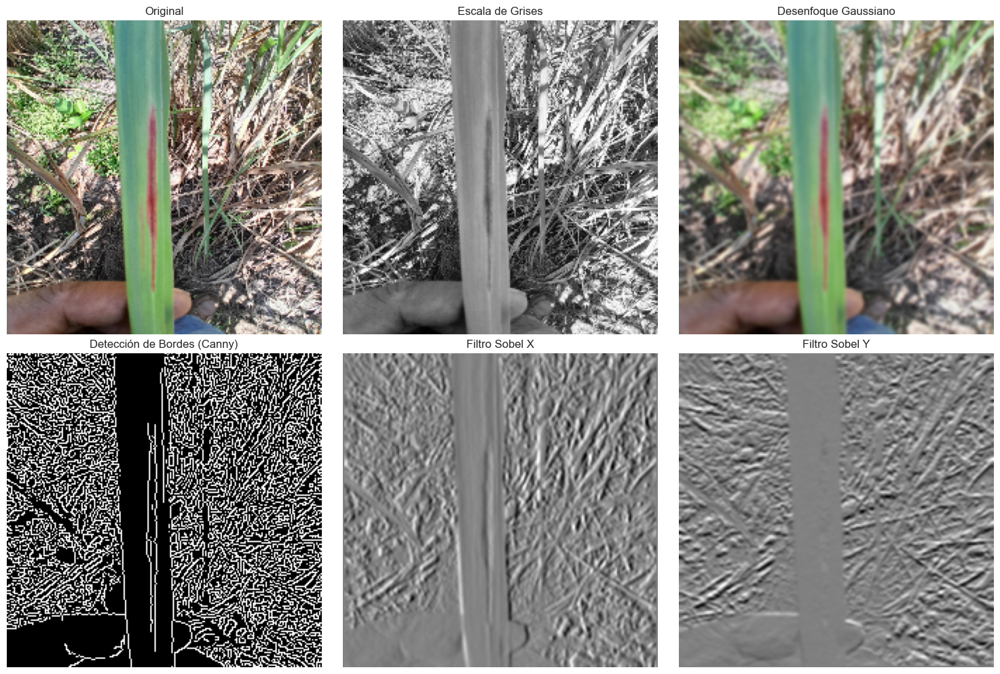


Aplicando filtros a una imagen de la clase: Clororis


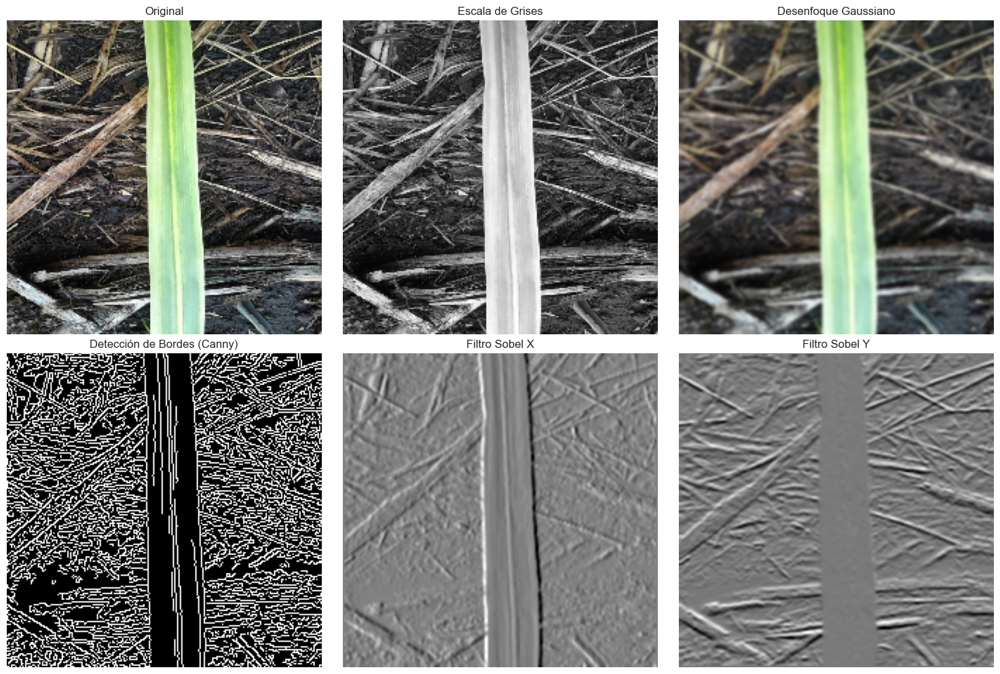


Aplicando filtros a una imagen de la clase: Hoja sana


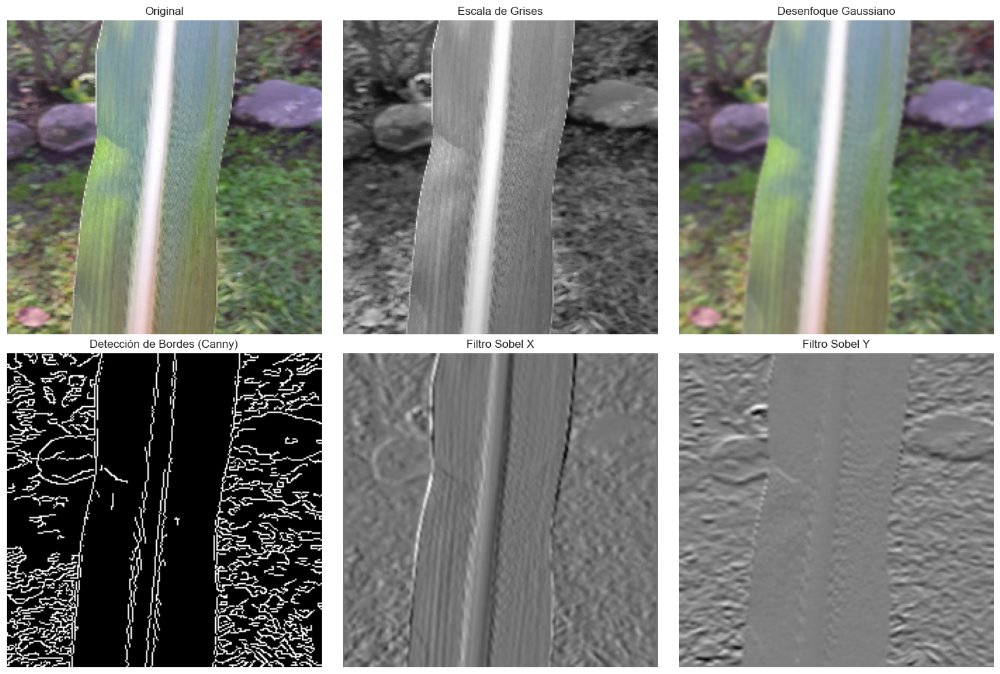


Aplicando filtros a una imagen de la clase: Roya naranja


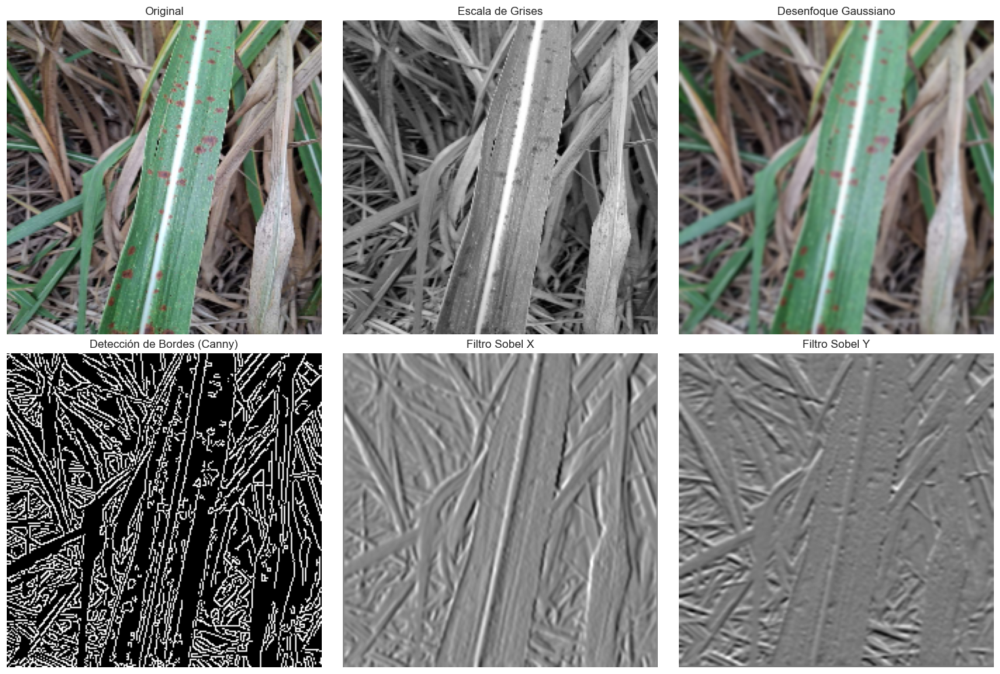


Aplicando filtros a una imagen de la clase: Roya purpura


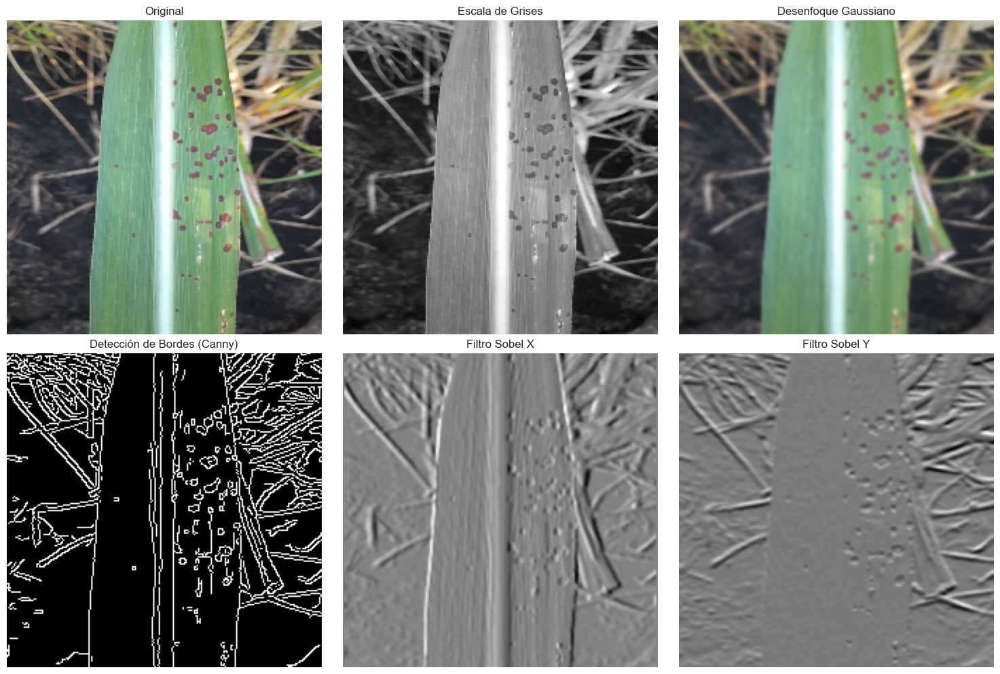

In [14]:
# --------------------- 4. Aplicación de Filtros y Técnicas de Procesamiento de Imágenes ---------------------

def apply_image_filters(image_path):
    """
    Aplica diferentes filtros a una imagen y muestra los resultados.

    Args:
        image_path (str): Ruta de la imagen a procesar.
    """
    # Leer la imagen y verificar si se leyó correctamente
    image = cv2.imread(image_path)
    if image is None:
        print(f"No se pudo leer la imagen en la ruta: {image_path}")
        return
    # Continuar con el procesamiento
    image = cv2.resize(image, (224, 224))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Filtros
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(image_rgb, (5, 5), 0)
    edges = cv2.Canny(image, 100, 200)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)

    # Mostrar imágenes
    images = [image_rgb, gray, blur, edges, sobelx, sobely]
    titles = ['Original', 'Escala de Grises', 'Desenfoque Gaussiano', 'Detección de Bordes (Canny)', 'Filtro Sobel X', 'Filtro Sobel Y']

    plt.figure(figsize=(15, 10))
    for i in range(len(images)):
        plt.subplot(2, 3, i+1)
        if len(images[i].shape) == 2:
            plt.imshow(images[i], cmap='gray')
        else:
            plt.imshow(images[i])
        plt.title(titles[i], fontsize=12)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Aplicar filtros a una imagen de muestra de cada clase
# Aplicar filtros a una imagen de muestra de cada clase
for class_name in class_names:
    class_idx = dataset.class_to_idx[class_name]
    class_images = [img for img, label in dataset.samples if label == class_idx]
    print(f"\nAplicando filtros a una imagen de la clase: {class_name}")
    apply_image_filters(class_images[0])


Histograma de color para una imagen de muestra:


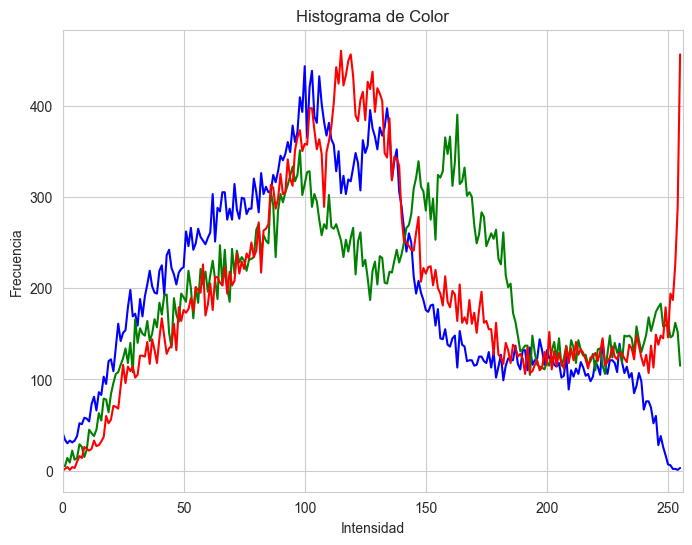

In [15]:
# --------------------- 5. Análisis del Histograma de Color ---------------------

def plot_color_histogram(image_path):
    """
    Muestra el histograma de color de una imagen en los canales RGB.

    Args:
        image_path (str): Ruta de la imagen a analizar.
    """
    # Leer la imagen
    image = cv2.imread(image_path)
    image = cv2.resize(image, (224, 224))
    chans = cv2.split(image)
    colors = ("b", "g", "r")
    plt.figure(figsize=(8, 6))
    plt.title('Histograma de Color')
    plt.xlabel('Intensidad')
    plt.ylabel('Frecuencia')

    # Iterar sobre cada canal de color
    for (chan, color) in zip(chans, colors):
        hist = cv2.calcHist([chan], [0], None, [256], [0, 256])
        plt.plot(hist, color=color)
        plt.xlim([0, 256])
    plt.show()

# Mostrar el histograma de color para una imagen de muestra
print("\nHistograma de color para una imagen de muestra:")
plot_color_histogram(dataset.samples[0][0])


In [16]:
!pip install scikit-image



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: C:\Users\ealda\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [17]:
import skimage
print(skimage.__version__)


0.24.0


In [18]:
from skimage.feature import graycomatrix, graycoprops

In [19]:
# --------------------- 6. Análisis de Textura con Matriz de Co-ocurrencia de Nivel de Gris (GLCM) ---------------------

try:
    from skimage.feature import graycomatrix, graycoprops
    print("Funciones de skimage.feature importadas correctamente.")
except ImportError as e:
    print(f"Error al importar funciones de skimage.feature: {e}")

def analyze_texture_features(dataset):
    """
    Analiza características de textura utilizando GLCM.

    Args:
        dataset (Dataset): El dataset de imágenes.
    """
    contrast = []
    dissimilarity = []
    homogeneity = []
    energy = []
    correlation = []
    ASM = []

    for img_path, _ in dataset.samples:
        image = Image.open(img_path).convert('L')  # Convertir a escala de grises
        image = image.resize((128, 128))
        img_array = np.array(image, dtype=np.uint8)
        # Calcular la matriz GLCM
        glcm = graycomatrix(img_array, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
        # Extraer propiedades de textura
        contrast.append(graycoprops(glcm, 'contrast')[0, 0])
        dissimilarity.append(graycoprops(glcm, 'dissimilarity')[0, 0])
        homogeneity.append(graycoprops(glcm, 'homogeneity')[0, 0])
        energy.append(graycoprops(glcm, 'energy')[0, 0])
        correlation.append(graycoprops(glcm, 'correlation')[0, 0])
        ASM.append(graycoprops(glcm, 'ASM')[0, 0])

    # Crear DataFrame para análisis
    df_texture = pd.DataFrame({
        'Contraste': contrast,
        'Disimilaridad': dissimilarity,
        'Homogeneidad': homogeneity,
        'Energía': energy,
        'Correlación': correlation,
        'ASM': ASM
    })

    return df_texture

# Llamar a la función para analizar características de textura
df_texture = analyze_texture_features(dataset)


Funciones de skimage.feature importadas correctamente.


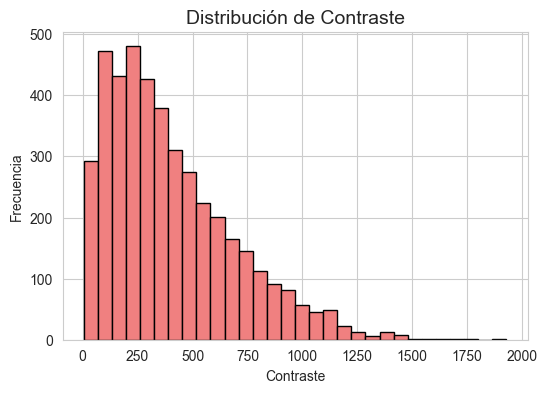

In [20]:
# Histograma de 'Contraste'
df_texture['Contraste'].hist(figsize=(6, 4), bins=30, color='lightcoral', edgecolor='black')
plt.title('Distribución de Contraste', fontsize=14)
plt.xlabel('Contraste')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


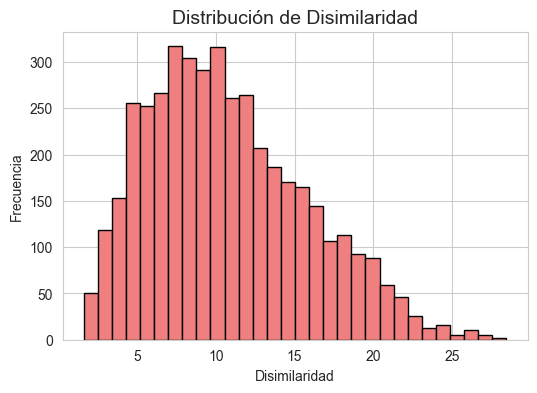

In [21]:
# Histograma de 'Disimilaridad'
df_texture['Disimilaridad'].hist(figsize=(6, 4), bins=30, color='lightcoral', edgecolor='black')
plt.title('Distribución de Disimilaridad', fontsize=14)
plt.xlabel('Disimilaridad')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


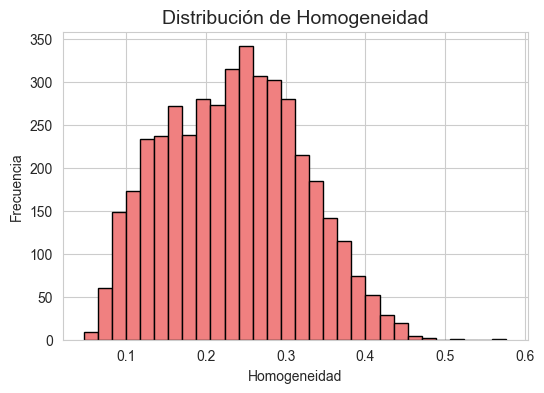

In [22]:
# Histograma de 'Homogeneidad'
df_texture['Homogeneidad'].hist(figsize=(6, 4), bins=30, color='lightcoral', edgecolor='black')
plt.title('Distribución de Homogeneidad', fontsize=14)
plt.xlabel('Homogeneidad')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


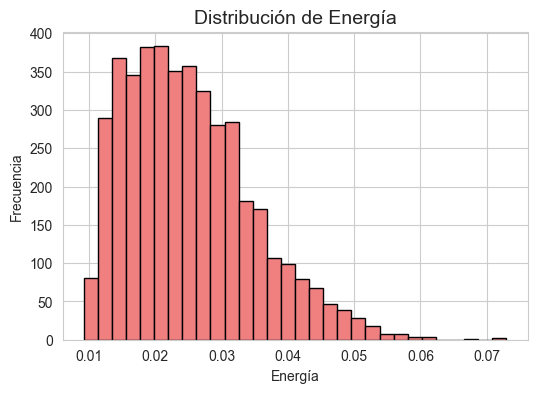

In [23]:
# Histograma de 'Energía'
df_texture['Energía'].hist(figsize=(6, 4), bins=30, color='lightcoral', edgecolor='black')
plt.title('Distribución de Energía', fontsize=14)
plt.xlabel('Energía')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


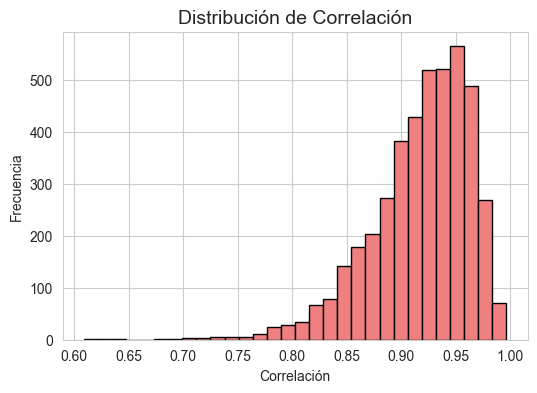

In [24]:
# Histograma de 'Correlación'
df_texture['Correlación'].hist(figsize=(6, 4), bins=30, color='lightcoral', edgecolor='black')
plt.title('Distribución de Correlación', fontsize=14)
plt.xlabel('Correlación')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


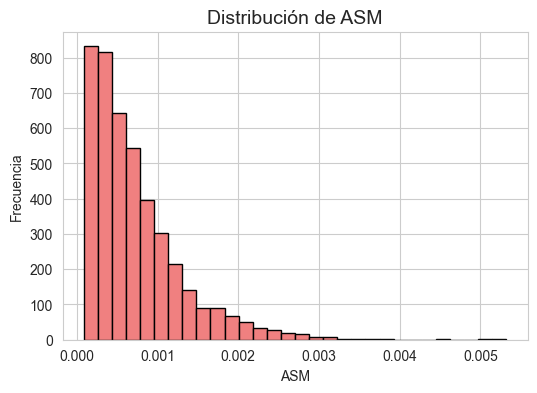

In [25]:
# Histograma de 'ASM'
df_texture['ASM'].hist(figsize=(6, 4), bins=30, color='lightcoral', edgecolor='black')
plt.title('Distribución de ASM', fontsize=14)
plt.xlabel('ASM')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()


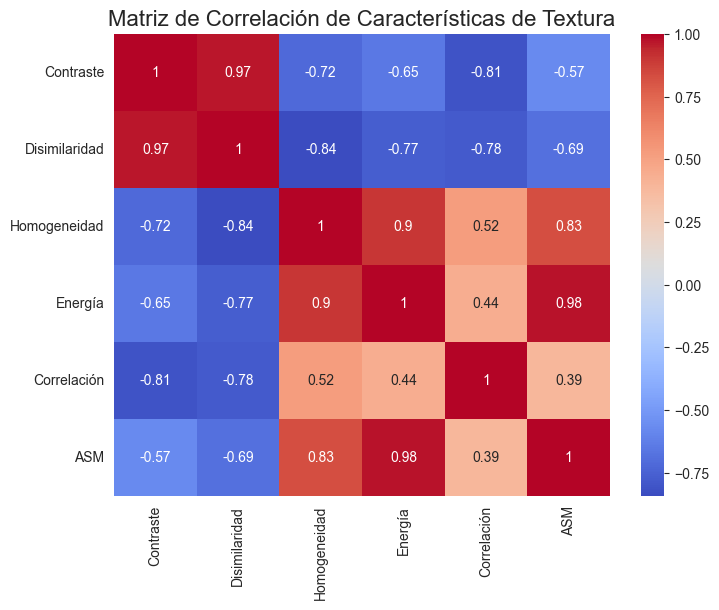

In [26]:
# Matriz de correlación
plt.figure(figsize=(8, 6))
sns.heatmap(df_texture.corr(), annot=True, cmap='coolwarm')
plt.title('Matriz de Correlación de Características de Textura', fontsize=16)
plt.show()


In [27]:
# --------------------- 7. Extracción de Características con Redes Neuronales Convolucionales ---------------------

# Utilizar una red preentrenada (por ejemplo, ResNet18) para extraer características
model = models.resnet18(pretrained=True)
model = model.to(device)
model.eval()  # Cambiar a modo de evaluación

# Modificar el modelo para extraer características antes de la capa final
model_features = nn.Sequential(*list(model.children())[:-1])  # Eliminar la última capa (clasificación)

def extract_features(loader, model, device):
    """
    Extrae características del dataset utilizando el modelo preentrenado.

    Args:
        loader (DataLoader): DataLoader del dataset.
        model (nn.Module): Modelo preentrenado modificado.
        device (torch.device): Dispositivo para computación.

    Returns:
        features (np.array): Características extraídas.
        labels (np.array): Etiquetas correspondientes.
    """
    features = []
    labels = []

    with torch.no_grad():
        for images, lbls in loader:
            images = images.to(device)
            output = model(images)
            output = output.view(output.size(0), -1)  # Aplanar las características
            features.append(output.cpu())
            labels.extend(lbls.numpy())

    features = torch.cat(features).numpy()
    labels = np.array(labels)
    return features, labels

# Extraer características del dataset
features, labels = extract_features(data_loader, model_features, device)
print(f"\nCaracterísticas extraídas: {features.shape}")

C:\Users\ealda\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ealda\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Características extraídas: (4308, 512)


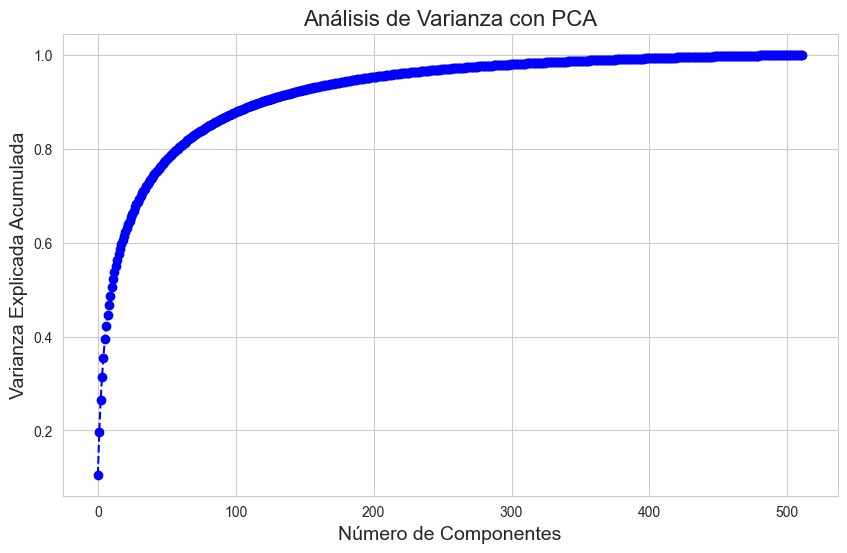

Número de componentes para explicar el 95% de la varianza: 195


In [28]:
# --------------------- 8. Análisis de Varianza con PCA ---------------------

def analyze_pca(features):
    """
    Analiza la varianza explicada por los componentes principales.

    Args:
        features (np.array): Características extraídas.
    """
    # Aplicar PCA
    pca = PCA()
    pca.fit(features)

    # Calcular varianza explicada acumulada
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

    # Gráfico de codo
    plt.figure(figsize=(10, 6))
    plt.plot(cumulative_variance, marker='o', linestyle='--', color='b')
    plt.title('Análisis de Varianza con PCA', fontsize=16)
    plt.xlabel('Número de Componentes', fontsize=14)
    plt.ylabel('Varianza Explicada Acumulada', fontsize=14)
    plt.grid(True)
    plt.show()

    # Determinar el número de componentes para explicar el 95% de la varianza
    n_components = np.argmax(cumulative_variance >= 0.95) + 1
    print(f"Número de componentes para explicar el 95% de la varianza: {n_components}")

# Llamar a la función para analizar PCA
analyze_pca(features)

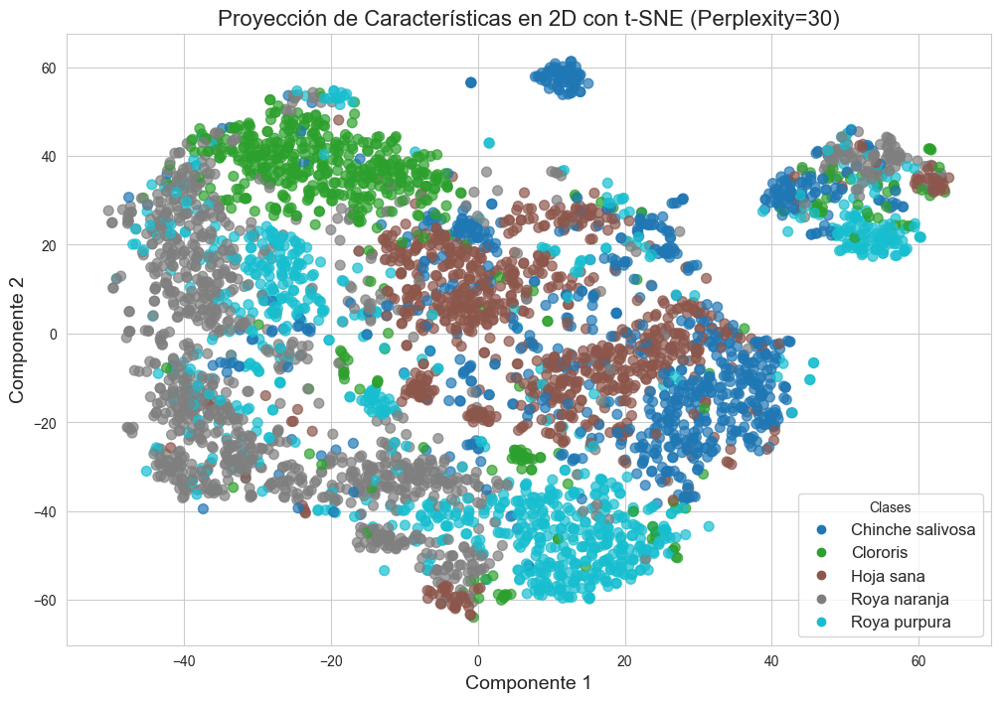

In [29]:
# --------------------- 9. Visualización en 2D con t-SNE ---------------------

def visualize_latent_space(features, labels, class_names, perplexity=30, n_iter=1000):
    """
    Visualiza las características en un espacio 2D utilizando t-SNE.

    Args:
        features (np.array): Características extraídas.
        labels (np.array): Etiquetas correspondientes.
        class_names (list): Lista con los nombres de las clases.
        perplexity (int): Perplejidad para t-SNE.
        n_iter (int): Número de iteraciones para t-SNE.
    """
    # Usar PCA para reducir la dimensionalidad antes de aplicar t-SNE
    pca = PCA(n_components=50)
    features_pca = pca.fit_transform(features)

    # Aplicar t-SNE
    tsne = TSNE(n_components=2, perplexity=perplexity, n_iter=n_iter, random_state=42)
    features_tsne = tsne.fit_transform(features_pca)

    # Visualizar el resultado
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(features_tsne[:, 0], features_tsne[:, 1], c=labels, cmap='tab10', s=50, alpha=0.7)
    # Crear leyenda personalizada
    handles = []
    for i, class_name in enumerate(class_names):
        handles.append(plt.Line2D([], [], marker='o', color=scatter.cmap(scatter.norm(i)), linestyle='', label=class_name))
    plt.legend(handles=handles, title="Clases", fontsize=12)
    plt.title(f"Proyección de Características en 2D con t-SNE (Perplexity={perplexity})", fontsize=16)
    plt.xlabel('Componente 1', fontsize=14)
    plt.ylabel('Componente 2', fontsize=14)
    plt.show()


# Llamar a la función para visualizar el espacio latente
visualize_latent_space(features, labels, class_names)

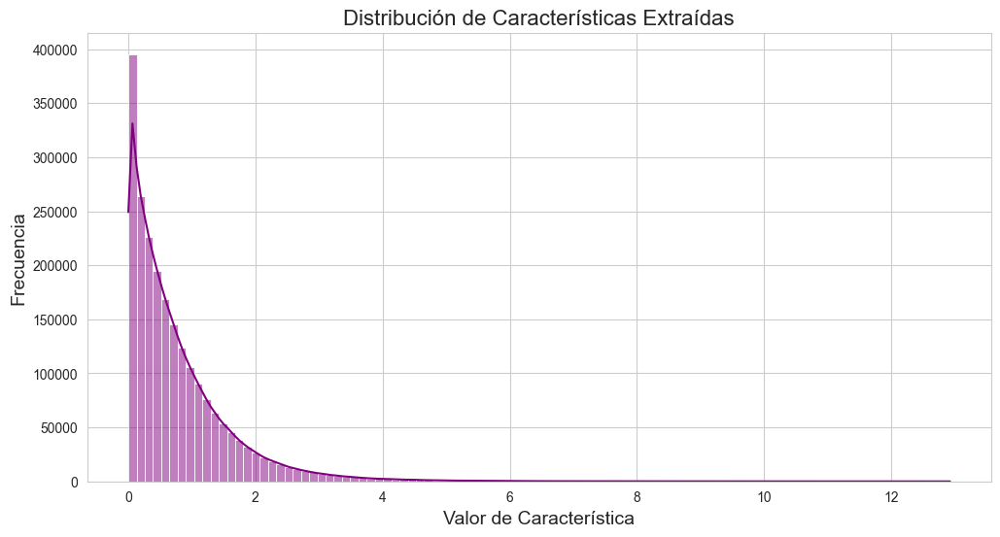

In [30]:
# --------------------- 10. Distribución de Características ---------------------

def plot_feature_distribution(features):
    """
    Muestra la distribución de las características extraídas.

    Args:
        features (np.array): Características extraídas.
    """
    # Aplanar las características
    flattened_features = features.flatten()

    # Gráfico de distribución
    plt.figure(figsize=(12, 6))
    sns.histplot(flattened_features, bins=100, kde=True, color='purple')
    plt.title('Distribución de Características Extraídas', fontsize=16)
    plt.xlabel('Valor de Característica', fontsize=14)
    plt.ylabel('Frecuencia', fontsize=14)
    plt.show()

# Llamar a la función para plotear la distribución de características
plot_feature_distribution(features)

In [31]:
# --------------------- 11. Evaluación de Separabilidad entre Clases ---------------------

from sklearn.metrics import pairwise_distances
from sklearn.metrics import silhouette_score

def evaluate_class_separability(features, labels):
    """
    Evalúa la separabilidad entre clases utilizando el índice de silueta.

    Args:
        features (np.array): Características extraídas.
        labels (np.array): Etiquetas correspondientes.
    """
    # Calcular el índice de silueta
    silhouette_avg = silhouette_score(features, labels)
    print(f"\nÍndice de Silueta para la Separabilidad de Clases: {silhouette_avg:.4f}")

# Llamar a la función para evaluar la separabilidad
evaluate_class_separability(features, labels)


Índice de Silueta para la Separabilidad de Clases: 0.0149


Número de outliers detectados: 216


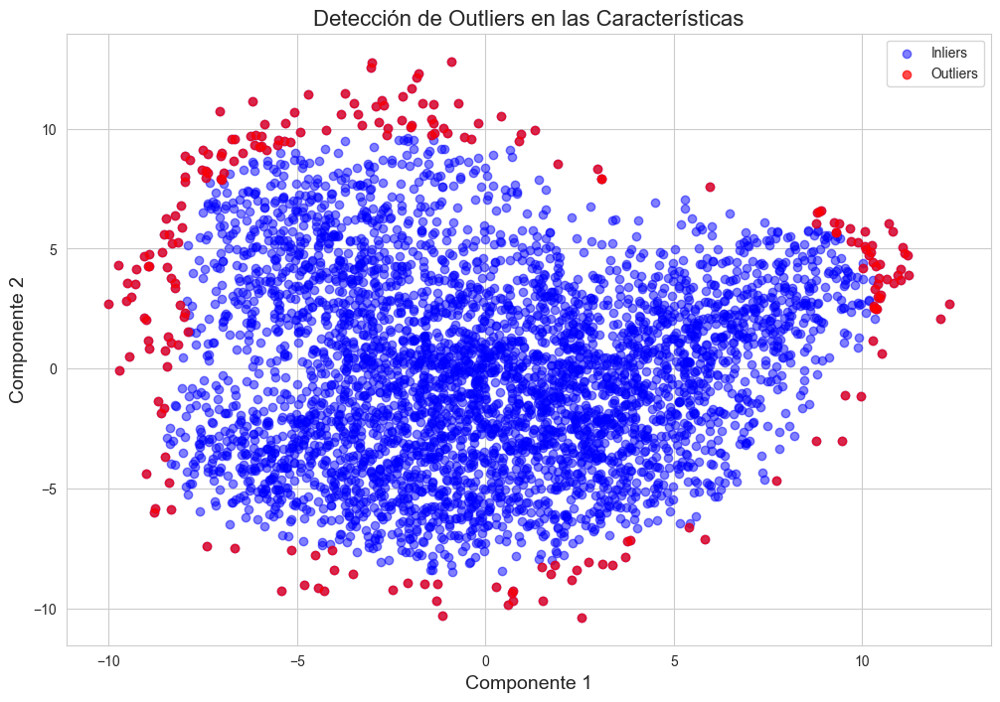

In [32]:
# --------------------- 12. Análisis de Outliers ---------------------

from sklearn.ensemble import IsolationForest

def detect_outliers(features):
    """
    Detecta outliers en las características extraídas.

    Args:
        features (np.array): Características extraídas.
    """
    # Modelo de detección de outliers
    iso_forest = IsolationForest(contamination=0.05, random_state=42)
    y_pred = iso_forest.fit_predict(features)
    outliers = np.where(y_pred == -1)[0]
    print(f"Número de outliers detectados: {len(outliers)}")

    # Visualizar outliers en t-SNE
    plt.figure(figsize=(12, 8))
    plt.scatter(features[:, 0], features[:, 1], c='blue', label='Inliers', alpha=0.5)
    plt.scatter(features[outliers, 0], features[outliers, 1], c='red', label='Outliers', alpha=0.7)
    plt.title('Detección de Outliers en las Características', fontsize=16)
    plt.xlabel('Componente 1', fontsize=14)
    plt.ylabel('Componente 2', fontsize=14)
    plt.legend()
    plt.show()

# Reducir dimensiones para visualización
pca = PCA(n_components=2)
features_2d = pca.fit_transform(features)

# Llamar a la función para detectar y visualizar outliers
detect_outliers(features_2d)

# ---------------------------------- Conclusiones y Próximos Pasos ----------------------------------

Conclusiones:

- **Distribución de Clases**: Se observó que algunas clases pueden estar desbalanceadas. Es importante considerar técnicas de balanceo de datos o aumentación específica para clases minoritarias.

- **Propiedades de las Imágenes**: Variaciones en brillo, contraste y tamaño podrían afectar el rendimiento del modelo. La normalización y el preprocesamiento adecuado son esenciales.

- **Análisis de Textura y Color**: Las características de textura y color pueden proporcionar información adicional para la clasificación. Considerar su inclusión en el modelo.

- **Extracción de Características**: Las características extraídas con ResNet18 muestran cierta separabilidad entre clases, pero podría mejorarse con modelos más profundos o ajustados.

- **Separabilidad de Clases**: Un índice de silueta moderado sugiere que las clases no están completamente separadas en el espacio de características. Podría beneficiarse de técnicas de ingeniería de características o modelos más avanzados.

Próximos Pasos:

- **Preprocesamiento Avanzado**: Implementar técnicas de preprocesamiento como ecualización de histograma, eliminación de ruido o enfoque adaptativo.

- **Aumentación de Datos**: Aplicar aumentaciones específicas para enriquecer el dataset, especialmente en clases minoritarias.

- **Modelos Personalizados**: Considerar el uso de modelos preentrenados más profundos (ResNet50, EfficientNet) o ajustar modelos con transfer learning.

- **Validación Cruzada**: Implementar validación cruzada para evaluar de manera más robusta el rendimiento del modelo.

- **Optimización de Hiperparámetros**: Utilizar técnicas como Grid Search o Bayesian Optimization para encontrar los mejores hiperparámetros.

- **Implementación de Métricas Adicionales**: Además de la precisión, considerar métricas como recall, precision y F1-score, especialmente si hay desbalance de clases.

